This is for plotting energy spectrum under neutral condition.\
Note: 1. data with diag_csat_ins >= 65 are discarded in advance.\
2. B1 (the 4th level) uses different CSAT model

2022-6-30

In [76]:
# This jupyter notebook command inserts matplotlib graphics in 
# to the workbook
%matplotlib inline

# import packages
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import os.path
import pickle
import time
from matplotlib.pyplot import figure
import scipy.io as sio
from datetime import date, timedelta
from math import *
from scipy.stats import gmean
from scipy import ndimage
from scipy import stats
from scipy import signal
# directories
IN_DIRECTORY = "/projectnb/urbanclimate/yueqin/idaho_ec_jupyter/basic_processed_data/"
IN_DIRECTORY2 = "/projectnb/urbanclimate/yueqin/idaho_ec_jupyter/processed_data/"
msk_DIR = "/projectnb/urbanclimate/yueqin/idaho_ec_jupyter/mask_data/"
OUT_DIRECTORY = "/projectnb/urbanclimate/yueqin/idaho_ec_jupyter/neutral_data_20200925_20210423/"
PLOT_DIRECTORY = "/projectnb/urbanclimate/yueqin/idaho_ec_jupyter/fig_neutral/"
ins_var=['u_ins'] # 36000 instantaneous variables per hour 
tur_var=['u_tur','v_tur','w_tur'] # 36000 instantaneous variables per hour 
neutral_var = ['neutral_case','u_star_m2','u_avg_neutral','delta0','A1_fit']

# Define constants and labels #

In [2]:
sonum    =12                       # number of sonic
z        = np.array([1.2,2,3.5,6,8.2,12.8,
                     15.8,23,30.3,40.2,50.6,60.5])  # height of sonic above ground, m
frequency=10                   # sampling frequency, Hz
time_avg =3600                  # average time, s
rpat = time_avg*frequency           # number of lines for a loop

# physical constants (or values that are assumed constant)
Rw  = 461.5     # ideal gas constant for water vapor, J/kg*K
Rd  = 287.05    # ideal gas constant for dry air, J/kg*K
Lv  = 1000*2257 # latent heat of vaporization (water), J/kg
Cp  = 1005      # approximate constant pressure specific heat of air, J/kg*K
kappa   = 0.4       # Von Karman constant
g   = 9.81      # acceleration of gravity, m/s^2
nu = 1.48 * 10**(-5) # kinematic viscosity, m2 /s

list_sel_m2 = np.array([5,6,7,8,9,10])

# Define useful functions #

In [56]:
def psd_welch(ts_data,fs,exp):
    """
    one-sided by default, scaling to 'spectrum' where Pxx has units of V**2, 
    if x is measured in V and fs is measured in Hz.
    """
    f,Pxx_den,Cor = [],[],[]
    for j in list_sel_m2:
        # replace nan by mean value
        x = ts_data[:,j]
        x[np.argwhere(np.isnan(x))] = np.nanmean(ts_data[:,j])
        # timeseries is divided into segments of length equal to the value of 'nperseg'
        f0, Pxx_den0 = signal.welch(x, fs, nperseg=2**exp)
        f = np.append(f, f0)
        # print(f.shape)
        Pxx_den = np.append(Pxx_den,Pxx_den0)
        # compute the correlation coefficient to 
        # check the energy loss due to windowing and averaging for FFT 
        df=f0[1]-f0[0]
        Cor0=np.nanmean(x**2)/np.nansum(Pxx_den0*df)
        Cor = np.append(Cor,Cor0)
    f = np.reshape(f,(-1,len(list_sel_m2)),'F')
    Pxx_den = np.reshape(Pxx_den,(-1,len(list_sel_m2)),'F')
    Cor = np.reshape(Cor,(-1,len(list_sel_m2)),'F')
    # normalize spectral density by velocity variance
    # Pxx_den = Pxx_den/np.nanmean(ts_data[:,list_sel_m2]**2,axis=0)[None,:]
    return f,Pxx_den,Cor

def ec_spectral_expavg(x):
    """
    USAGE:  
    [y] = ec_spectral_expavg(x)
    AUTHOR: 
    Zhongming Gao               
 
    VERSION NUMBER: 3.1 (19th March, 2013)

    REFERENCES:
    Roland B. Stull, 1988: An Introduction to Boundary Layer Meteorology.
    Kluwer Academic Publishers. pp 308-310
    """
    # local varibal
    [N, M] = x.shape
    N = int(np.fix(log10(N) / 0.05))
    y = np.zeros((N, M))*np.nan
    
    for j in range(M):
        for i in range(20):
            y[i,j] = x[i,j]
        for i in np.arange(20,(N - 1)):
            y[i,j] = np.nanmean(x[int(np.fix(10**(0.05*(i-1)) + 11)):
                                  int(np.fix(10**(0.05*i) + 10)), j])
            # print('--------i='+str(i))
            # print(int(np.fix(10**(0.05*(i-1)) + 11)))
            # print(int(np.fix(10**(0.05*i) + 10)))
        y[N-1, j] = np.nanmean(x[int(np.fix(10**(0.05*i) + 11)):, j])
        # print('********')
        # print(int(np.fix(10**(0.05*i) + 11)))
    return y

In [55]:
a = np.linspace(1,5,5)
b = np.linspace(6,10,5)
c = np.append(a,b)
np.reshape(c,(5,2),'F')

array([[ 1.,  6.],
       [ 2.,  7.],
       [ 3.,  8.],
       [ 4.,  9.],
       [ 5., 10.]])

# Compute the power spectral density #
Estimate power spectral density using Welch’s method.

In [77]:
# load neutral case index
for var in neutral_var:
    a_file = open(OUT_DIRECTORY + var +'.pkl', "rb")
    globals()[var] = pickle.load(a_file)
    a_file.close()
nn = len(neutral_case)
wid = 1
n1=floor(rpat/wid)
n2=floor(log2(n1))
noverlap = 2**(n2-1)+1
f_u,f_v,f_w = (np.zeros((nn,noverlap,len(list_sel_m2))) * np.nan,) * 3
Puu_den,Pvv_den,Pww_den = (np.zeros((nn,noverlap,len(list_sel_m2))) * np.nan,) * 3
Cor_uu,Cor_vv,Cor_ww = (np.zeros((nn,len(list_sel_m2))) * np.nan,) * 3
den_uu_dim_expavg,k_dim_expavg,k_dim_delta_expavg,k_s_uu_dim_expavg = [],[],[],[]
for i in range(nn):
    strday = str(neutral_case[i][0].strftime("%Y%m%d"))
    print('start processing:'+ strday+'_'+str(neutral_case[i][1]))
    # load tur variables
    for var in tur_var:
        a_file = open(OUT_DIRECTORY + var +'_' + strday +'_'+str(neutral_case[i][1]) +'.pkl', "rb")
        globals()[var] = pickle.load(a_file)    
        a_file.close()
    # compute the power spectral density
    f_u[i,:,:],Puu_den[i,:,:],Cor_uu[i,:] = psd_welch(u_tur,frequency,n2)
    f_v[i,:,:],Pvv_den[i,:,:],Cor_vv[i,:] = psd_welch(v_tur,frequency,n2)
    f_w[i,:,:],Pww_den[i,:,:],Cor_ww[i,:] = psd_welch(w_tur,frequency,n2)    
    # calculate the exponent average of the data
    freq_wel_expavg = ec_spectral_expavg(f_u[0,:,:])
    den_uu_dim_expavg0 = ec_spectral_expavg(f_u[i,:,:]*Puu_den[i,:,:]/u_star_m2[i]**2)
    den_uu_dim_expavg = np.append(den_uu_dim_expavg,den_uu_dim_expavg0)
    # for j in range(len(list_sel_m2)):
    #     ij = list_sel_m2[j]
    #     k_dim_expavg0 = 2*pi*freq_wel_expavg[:,j]/u_avg_neutral[i,ij]*z[ij]
    #     k_dim_expavg = np.append(k_dim_expavg,k_dim_expavg0)
    #     k_dim_delta_expavg0 = 2*pi*freq_wel_expavg[:,j]/u_avg_neutral[i,ij]*delta0[i]
    #     k_dim_delta_expavg = np.append(k_dim_delta_expavg,k_dim_delta_expavg0)
    k_dim_expavg0 = 2*pi*freq_wel_expavg/u_avg_neutral[i,list_sel_m2]*z[list_sel_m2]
    k_dim_expavg = np.append(k_dim_expavg,k_dim_expavg0)
    k_dim_delta_expavg0 = 2*pi*freq_wel_expavg/u_avg_neutral[i,list_sel_m2]*delta0[i]
    k_dim_delta_expavg = np.append(k_dim_delta_expavg,k_dim_delta_expavg0)
    k_s_uu_dim_expavg0 = ec_spectral_expavg(2*pi*f_u[i,:,:]/u_avg_neutral[i,list_sel_m2]*Puu_den[i,:,:]/u_star_m2[i]**2)   
    k_s_uu_dim_expavg = np.append(k_s_uu_dim_expavg,k_s_uu_dim_expavg0)
        
den_uu_dim_expavg = np.reshape(den_uu_dim_expavg,(-1,84,6))
k_dim_expavg = np.reshape(k_dim_expavg,(-1,84,6))
k_dim_delta_expavg = np.reshape(k_dim_delta_expavg,(-1,84,6))
k_s_uu_dim_expavg = np.reshape(k_s_uu_dim_expavg,(-1,84,6))

start processing:20200925_16
start processing:20200925_17
start processing:20200925_19
start processing:20201010_16
start processing:20201010_21
start processing:20201012_17
start processing:20201012_18
start processing:20201013_14
start processing:20201013_16
start processing:20201013_18
start processing:20201013_19
start processing:20201016_17
start processing:20201017_17
start processing:20201018_16
start processing:20201019_9
start processing:20201019_17
start processing:20201021_9
start processing:20201021_15
start processing:20201021_16
start processing:20201021_18
start processing:20201022_4
start processing:20201030_16
start processing:20201030_17
start processing:20201115_11
start processing:20201119_11
start processing:20201119_12
start processing:20201119_13
start processing:20201119_14
start processing:20201119_15
start processing:20201119_16
start processing:20201119_17
start processing:20210103_16
start processing:20210123_11
start processing:20210124_5
start processing:2

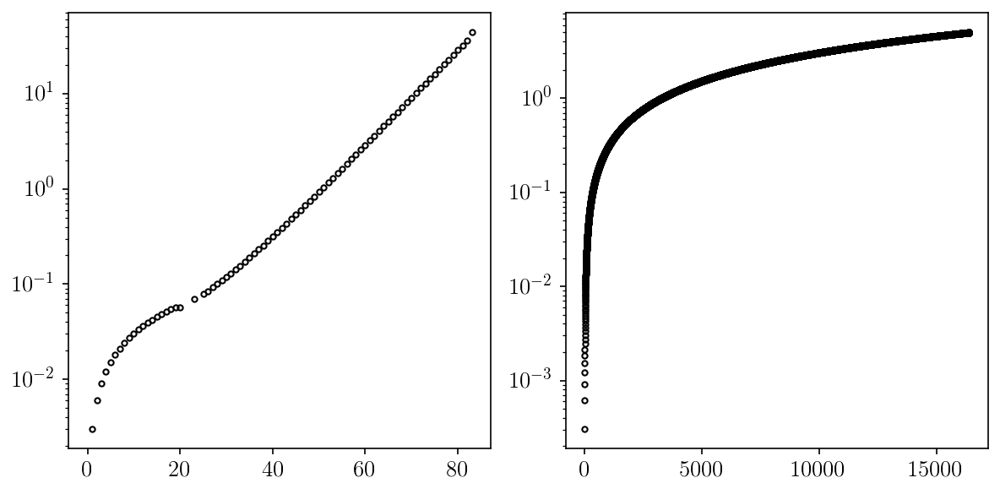

In [65]:
fig = plt.figure(figsize=(8,4), dpi=150,tight_layout=True)
ax1 = fig.add_subplot(121)
plt.plot(k_dim_expavg0[:,0],'.',color = 'k',markerfacecolor='none')
ax1.set_yscale('log')

ax2 = fig.add_subplot(122)
plt.plot(f_u[0,:,0],'.',color = 'k',markerfacecolor='none')
ax2.set_yscale('log')

In [78]:
%whos ndarray list 

Variable              Type       Data/Info
------------------------------------------
A1_fit                ndarray    71: 71 elems, type `float64`, 568 bytes
Cor_uu                ndarray    71x6: 426 elems, type `float64`, 3408 bytes
Cor_vv                ndarray    71x6: 426 elems, type `float64`, 3408 bytes
Cor_ww                ndarray    71x6: 426 elems, type `float64`, 3408 bytes
Puu_den               ndarray    71x16385x6: 6980010 elems, type `float64`, 55840080 bytes (53.25325012207031 Mb)
Pvv_den               ndarray    71x16385x6: 6980010 elems, type `float64`, 55840080 bytes (53.25325012207031 Mb)
Pww_den               ndarray    71x16385x6: 6980010 elems, type `float64`, 55840080 bytes (53.25325012207031 Mb)
a                     ndarray    5: 5 elems, type `float64`, 40 bytes
b                     ndarray    5: 5 elems, type `float64`, 40 bytes
c                     ndarray    10: 10 elems, type `float64`, 80 bytes
delta0                ndarray    71: 71 elems, type `flo

# Let's start plotting #

In [60]:
## PLOTTING STUFF
## define useful fonts
plt.rc('text', usetex=True)
# plt.rc('font', family='sans-serif')
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.weight"] = "bold"
plt.rc('xtick', labelsize=13) 
plt.rc('ytick', labelsize=13)
font_size = 14
do_plot = True

## ks-kz for streamwise velocity ##

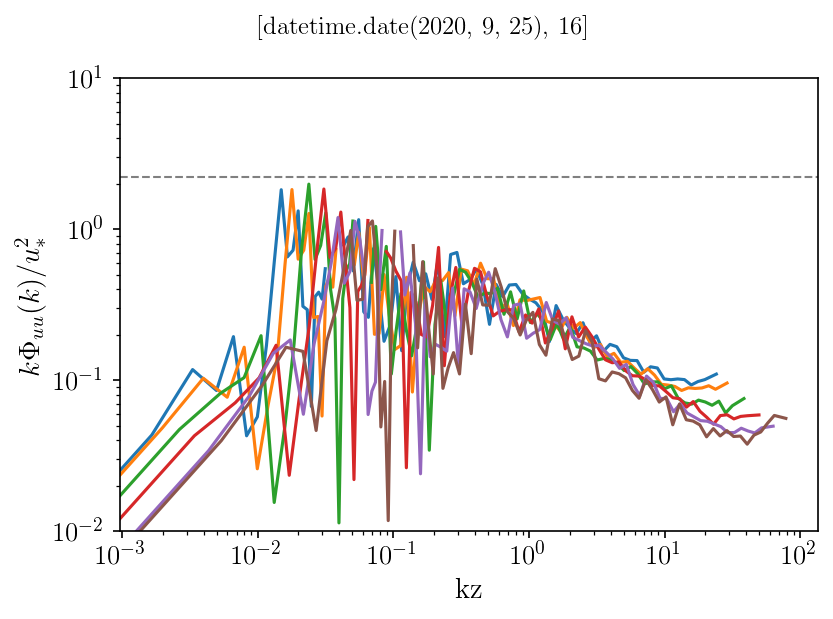

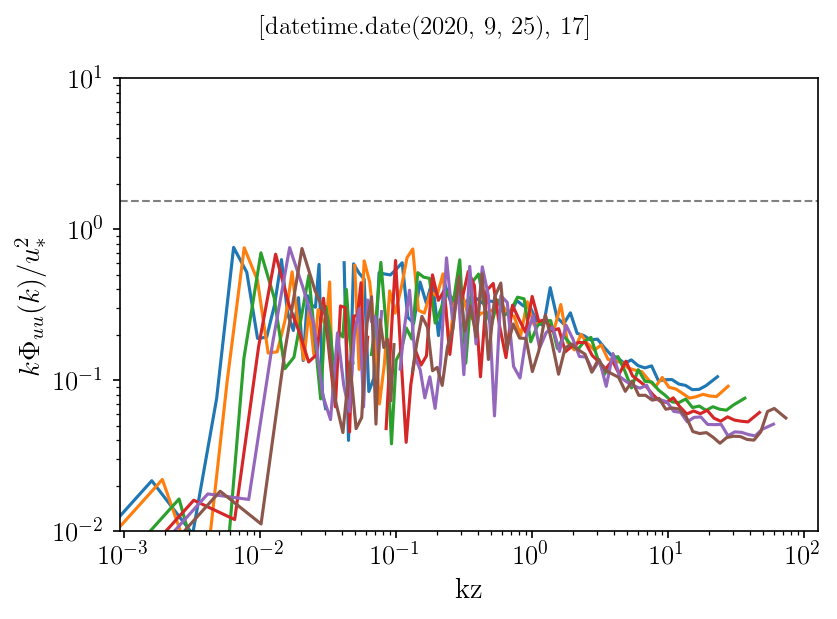

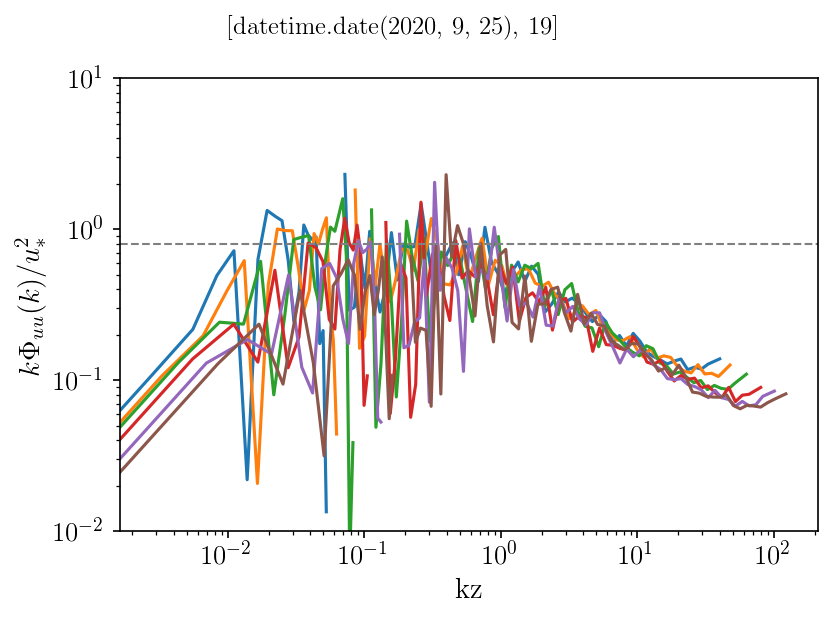

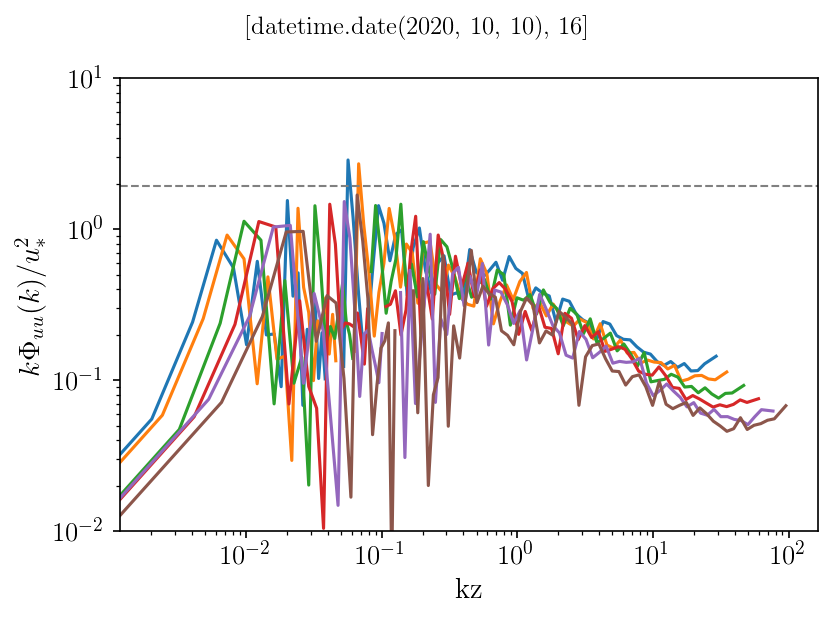

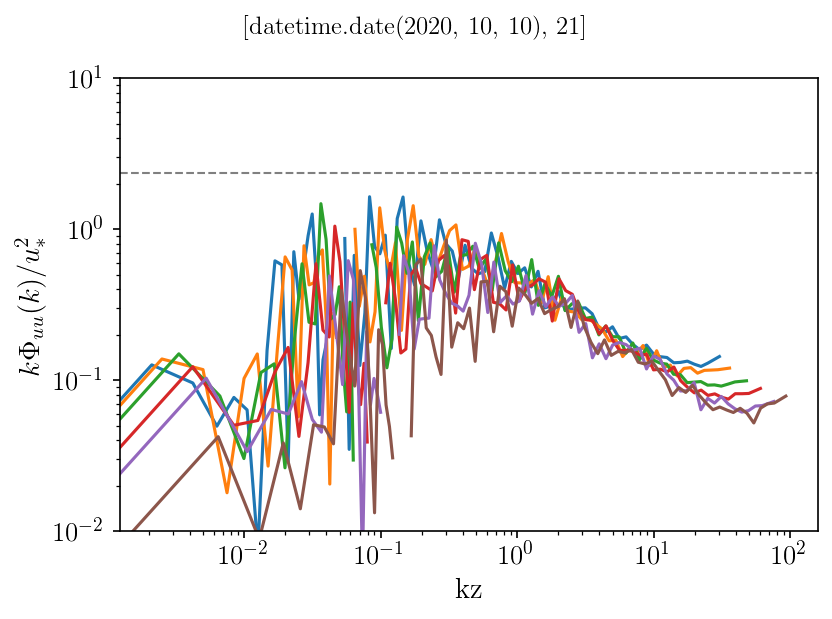

...

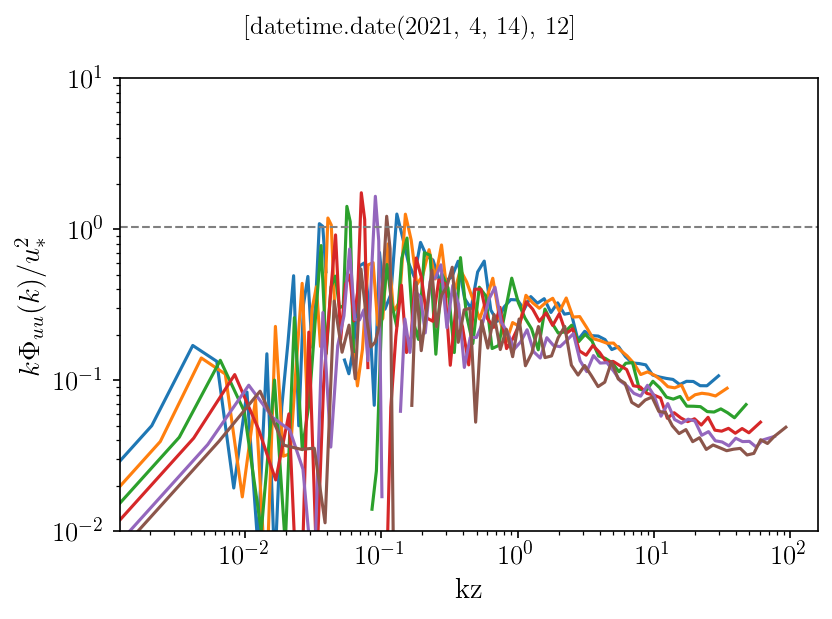

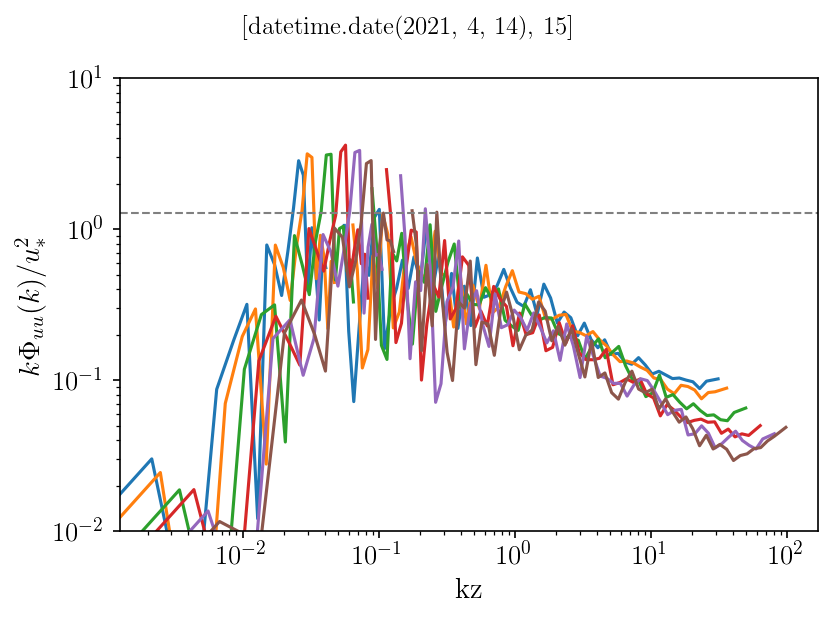

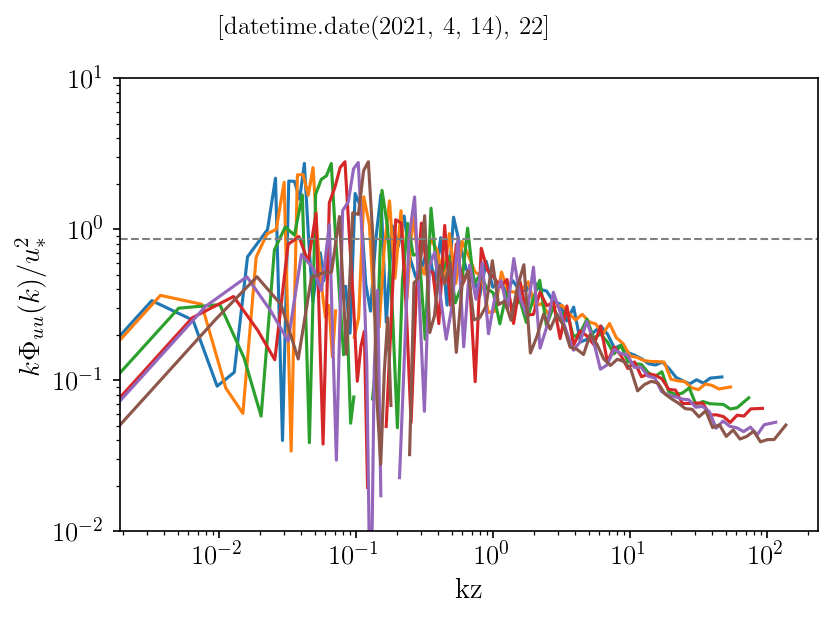

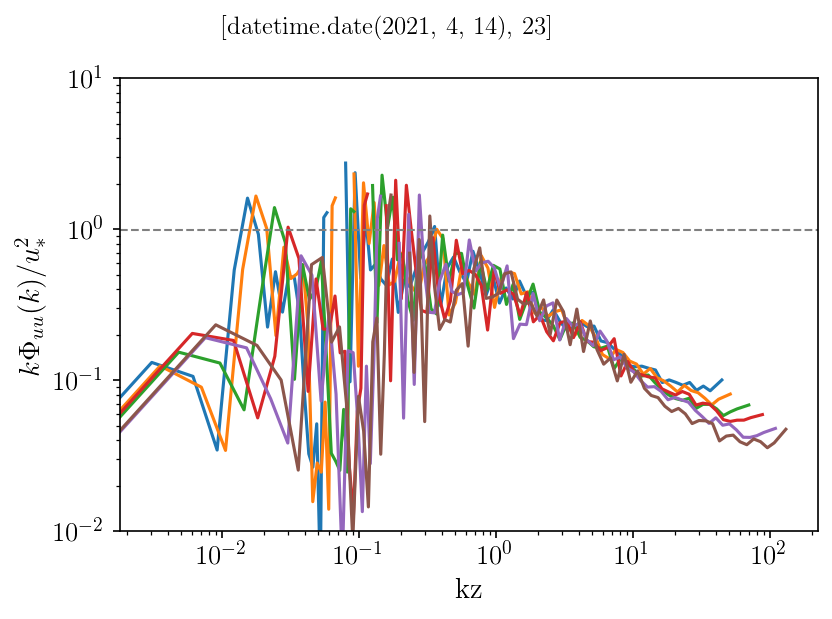

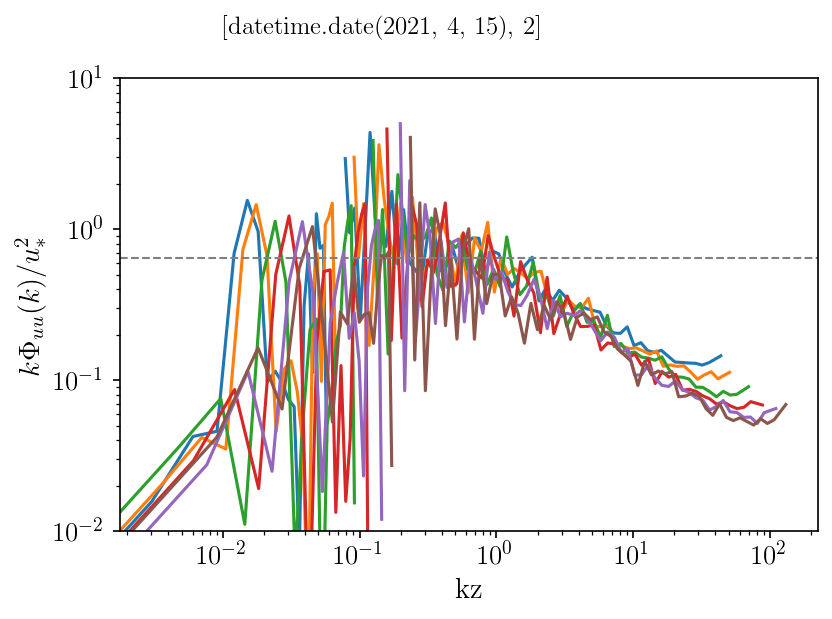

In [80]:
for i in np.arange(0,71):
    plt.figure(figsize=(6, 4), dpi=150)
    plt.loglog(k_dim_expavg[i,:,:],k_s_uu_dim_expavg[i,:,:])
    plt.text(1e-2,20,neutral_case[i], fontsize = 12)
    plt.axhline(y=A1_fit[i], color='grey', linestyle='--', linewidth=1)
    plt.xlabel(r'kz', fontsize = font_size)
    plt.ylabel(r'$k\Phi_{uu}(k)/u_*^2$', fontsize = font_size)
    # plt.xlim(1e-4, 1e4)
    plt.ylim(1e-2, 1e1)